# Задание 3

# Бинарная классификация

**Цель работы:** познакомиться с применением модели машинного обучения для решения задачи классификации (метод логистической регрессии)

Этот набор данных предоставляет информацию о размере заработной платы
работников.
Описание полей:

* **age** – возраст
* **workclass** – класс работы
* **education** – образование
* **education-num** –
* **marital-status** – семейное положение
* **occupation** – вид деятельности
* **relationship** – степень родства
* **race** – раса
* **sex** – пол
* **capital-gain** – прирост капитала
* **capital-loss** – убыток капитала
* **hours-per-week** – часов в неделю
* **native-country** – страна происхождения
* **salary** – зарплата
* **fnlwgt** – колонка, которая показывает сколько людей с такими
же характеристиками существует. Например:

* **sex**: Male

* **age**: 43

* **marital-status**: Maried

* **fnlwgt**: 1000

Это значит, что среди работников насчитывается 1000 таких 43-летних женатых мужчин

### 1. Импортируем необходимые библиотеки и загружаем необходимые данные

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
data = pd.read_csv("salary.csv")
data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


#### Выведем целевую переменную, целевые имена и частоту каждого уникального значения:

In [ ]:
(unique, counts) = np.unique(data['salary'], return_counts=True)
print('Unique values of the target variable: ', unique)
print('Counts of the target variable: ', counts)

Unique values of the target variable:  [' <=50K' ' >50K']
Counts of the target variable:  [24720  7841]


#### Построим столбчатую диаграмму, чтобы увидеть целевую переменную:

<Axes: xlabel='salary', ylabel='count'>

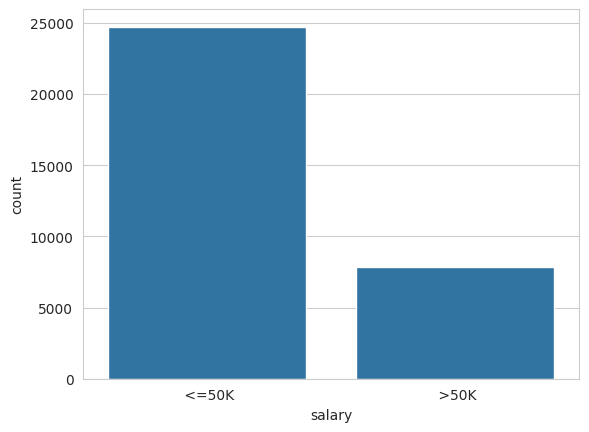

In [ ]:
sns.set_style("whitegrid")
sns.countplot(data, x = 'salary')

#### Анализ диаграммы показывает, что набор данных является сбалансированным

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education-num   32561 non-null  int64 
 5   marital-status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital-gain    32561 non-null  int64 
 11  capital-loss    32561 non-null  int64 
 12  hours-per-week  32561 non-null  int64 
 13  native-country  32561 non-null  object
 14  salary          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


#### В этом наборе данных у нас есть два класса: 0 и 1, что делает эту задачу задачей бинарной классификации.

#### Выполним бинарную классификацию с использованием логистической регрессии с помощью sklearn.

### 2. Проверяем наличие пропущенных значений и выбросов

In [ ]:
print(data.isnull().sum())

age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
native-country    0
salary            0
dtype: int64


<Axes: xlabel='age'>

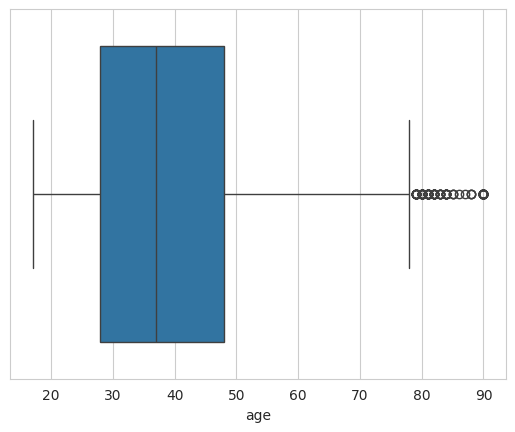

In [ ]:
sns.boxplot(x=data['age'])

### 3. Исключаем невлияющие категориальные признаки

In [ ]:
df_copy = data.copy()

cat_feat = ['marital-status',
            'relationship',
            'race',
            'capital-gain',
            'capital-loss',
            'hours-per-week',
            'fnlwgt']

df_copy.drop(cat_feat, axis=1, inplace=True)

df_copy.head()

,age,workclass,education,education-num,occupation,sex,native-country,salary
0,39,State-gov,Bachelors,13,Adm-clerical,Male,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Exec-managerial,Male,United-States,<=50K
2,38,Private,HS-grad,9,Handlers-cleaners,Male,United-States,<=50K
3,53,Private,11th,7,Handlers-cleaners,Male,United-States,<=50K
4,28,Private,Bachelors,13,Prof-specialty,Female,Cuba,<=50K


#### Признак "Sex" имеет по два значения.

In [ ]:
binary_male_female = {" Male": 1, " Female": 0}
df_copy['sex'] = df_copy['sex'].map(binary_male_female)
df_copy.head()

,age,workclass,education,education-num,occupation,sex,native-country,salary
0,39,State-gov,Bachelors,13,Adm-clerical,1,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Exec-managerial,1,United-States,<=50K
2,38,Private,HS-grad,9,Handlers-cleaners,1,United-States,<=50K
3,53,Private,11th,7,Handlers-cleaners,1,United-States,<=50K
4,28,Private,Bachelors,13,Prof-specialty,0,Cuba,<=50K


In [ ]:
workclass = {
    ' State-gov': 0,
    ' Self-emp-not-inc': 1,
    ' Private': 2,
    ' Federal-gov': 3,
    ' Local-gov': 4,
    ' ?': 5,
    ' Self-emp-inc': 6,
    ' Without-pay': 7,
    ' Never-worked': 8
}
education = {
    ' Bachelors': 0,
    ' HS-grad': 1,
    ' 11th': 2,
    ' Masters': 3,
    ' 9th': 4,
    ' Some-college': 5,
    ' Assoc-acdm': 6,
    ' Assoc-voc': 7,
    ' 7th-8th': 8,
    ' Doctorate': 9,
    ' Prof-school': 10,
    ' 5th-6th': 11,
    ' 10th': 12,
    ' 1st-4th': 13,
    ' Preschool': 14,
    ' 12th': 15
}
occupation = {
    ' Adm-clerical': 0,
    ' Exec-managerial': 1,
    ' Handlers-cleaners': 2,
    ' Prof-specialty': 3,
    ' Other-service': 4,
    ' Sales': 5,
    ' Craft-repair': 6,
    ' Transport-moving': 7,
    ' Farming-fishing': 8,
    ' Machine-op-inspct': 9,
    ' Tech-support': 10,
    ' ?': 11,
    ' Protective-serv': 12,
    ' Armed-Forces': 13,
    ' Priv-house-serv': 14
}
native_country = {
    ' United-States': 0,
    ' Cuba': 1,
    ' Jamaica': 2,
    ' India': 3,
    ' ?': 4,
    ' Mexico': 5,
    ' South': 6,
    ' Puerto-Rico': 7,
    ' Honduras': 8,
    ' England': 9,
    ' Canada': 10,
    ' Germany': 11,
    ' Iran': 12,
    ' Philippines': 13,
    ' Italy': 14,
    ' Poland': 15,
    ' Columbia': 16,
    ' Cambodia': 17,
    ' Thailand': 18,
    ' Ecuador': 19,
    ' Laos': 20,
    ' Taiwan': 21,
    ' Haiti': 22,
    ' Portugal': 23,
    ' Dominican-Republic': 24,
    ' El-Salvador': 25,
    ' France': 26,
    ' Guatemala': 27,
    ' China': 28,
    ' Japan': 29,
    ' Yugoslavia': 30,
    ' Peru': 31,
    ' Outlying-US(Guam-USVI-etc)': 32,
    ' Scotland': 33,
    ' Trinadad&Tobago': 34,
    ' Greece': 35,
    ' Nicaragua': 36,
    ' Vietnam': 37,
    ' Hong': 38,
    ' Ireland': 39,
    ' Hungary': 40,
    ' Holand-Netherlands': 41
}
salary = {
    ' <=50K': 0,
    ' >50K': 1
}
df_copy = df_copy.copy()

df_copy['workclass'] = df_copy['workclass'].map(workclass)
df_copy['education'] = df_copy['education'].map(education)
df_copy['occupation'] = df_copy['occupation'].map(occupation)
df_copy['native-country'] = df_copy['native-country'].map(native_country)
df_copy['salary'] = df_copy['salary'].map(salary)

# sex уже числовой, age и education-num тоже
df_copy = df_copy.astype('int64', errors='ignore')
df_copy.head()

,age,workclass,education,education-num,occupation,sex,native-country,salary
0,39,0,0,13,0,1,0,0
1,50,1,0,13,1,1,0,0
2,38,2,1,9,2,1,0,0
3,53,2,2,7,2,1,0,0
4,28,2,0,13,3,0,1,0


### 4. Разделяем данные на признаки и целевую переменную

In [ ]:
y = df_copy['salary']
X = df_copy.drop('salary', axis=1)

In [ ]:
X

,age,workclass,education,education-num,occupation,sex,native-country
0,39,0,0,13,0,1,0
1,50,1,0,13,1,1,0
2,38,2,1,9,2,1,0
3,53,2,2,7,2,1,0
4,28,2,0,13,3,0,1
5,37,2,3,14,1,0,0
6,49,2,4,5,4,0,2
7,52,1,1,9,1,1,0
8,31,2,3,14,3,0,0
9,42,2,0,13,1,1,0


### 5. Применяем операцию нормализации для численной устойчивости

In [ ]:
from sklearn.preprocessing import StandardScaler
standardizer = StandardScaler()
X = standardizer.fit_transform(X)

In [ ]:
X

array([[ 0.03067056, -1.88460023, -0.99158435, ..., -1.37812112,
         0.70307135, -0.25574647],
       [ 0.83710898, -1.0687461 , -0.99158435, ..., -1.08279326,
         0.70307135, -0.25574647],
       [-0.04264203, -0.25289198, -0.70202542, ..., -0.78746539,
         0.70307135, -0.25574647],
       ...,
       [ 1.42360965, -0.25289198, -0.70202542, ..., -1.37812112,
        -1.42233076, -0.25574647],
       [-1.21564337, -0.25289198, -0.70202542, ..., -1.37812112,
         0.70307135, -0.25574647],
       [ 0.98373415,  3.01052452, -0.70202542, ..., -1.08279326,
        -1.42233076, -0.25574647]])

### 6. Разделяем данные на тренировочный и тестовый наборы

#### 75% данных используется для обучения и 25%- для тестирования.

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

### 7. Обучаем модель логистической регрессии

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

### 8. Делаем прогноз на основе данных тестирования

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)
TN, FP, FN, TP = confusion_matrix(y_test, y_pred).ravel()

print('True Positive(TP)  = ', TP)
print('False Positive(FP) = ', FP)
print('True Negative(TN)  = ', TN)
print('False Negative(FN) = ', FN)

accuracy = (TP+TN) /(TP+FP+TN+FN)
print('Accuracy of the binary classification = {:0.3f}'.format(accuracy))

True Positive(TP)  =  717
False Positive(FP) =  406
True Negative(TN)  =  5753
False Negative(FN) =  1265
Accuracy of the binary classification = 0.795


In [ ]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

Accuracy: 0.7947426606068051


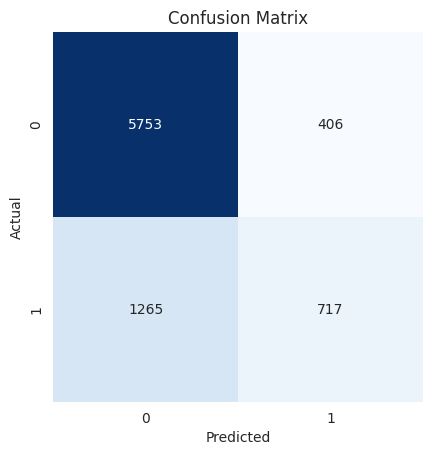

In [ ]:
sns.heatmap(cm, square=True, annot=True, fmt='d', cbar=False, cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Точность: {accuracy:.2f}")

Точность: 0.79


In [ ]:
from sklearn.metrics import precision_score, recall_score
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
print(f"Точность: {precision:.2f}")
print(f"Полнота: {recall:.2f}")

Точность: 0.64
Полнота: 0.36


In [ ]:
from sklearn.metrics import f1_score
f1 = f1_score(y_test, y_pred)
print(f"F1-мера: {f1:.2f}")


F1-мера: 0.46


In [ ]:
df_copy.corr()

,age,workclass,education,education-num,occupation,sex,native-country,salary
age,1.000000,0.082380,0.007767,0.036527,0.017201,0.088832,-0.011572,0.234037
workclass,0.082380,1.000000,0.011666,0.011343,0.217072,-0.019347,-0.010246,0.047203
education,0.007767,0.011666,1.000000,-0.279614,0.074961,-0.000550,0.067619,-0.046218
education-num,0.036527,0.011343,-0.279614,1.000000,-0.242997,0.012280,-0.066044,0.335154
occupation,0.017201,0.217072,0.074961,-0.242997,1.000000,0.147779,0.019578,-0.104691
sex,0.088832,-0.019347,-0.000550,0.012280,0.147779,1.000000,-0.005977,0.215980
native-country,-0.011572,-0.010246,0.067619,-0.066044,0.019578,-0.005977,1.000000,-0.028478
salary,0.234037,0.047203,-0.046218,0.335154,-0.104691,0.215980,-0.028478,1.000000


### 10. Строим ROC-кривую

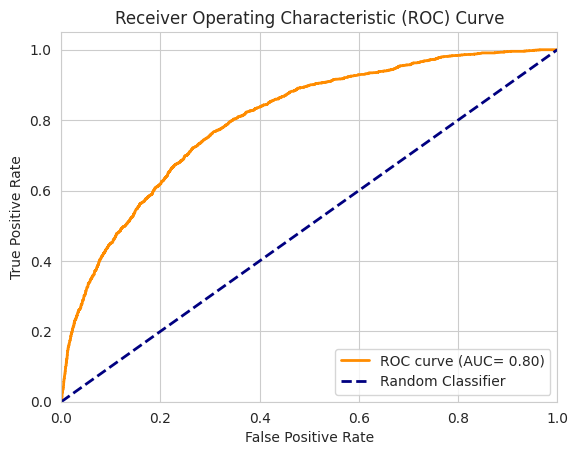

In [ ]:
from sklearn.metrics import roc_curve, auc

y_score = model.predict_proba(X_test) [:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC= {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()